<a href="https://colab.research.google.com/github/alitourani/deep-learning-from-scratch/blob/main/Codes/ML/Simple_Image_Augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Simple Image Augmentation**

🎯 **Goal:** The main objective is to introduce some simple tools for image augmentation. IA techniques are useful when the size of the training data is not enough or/and we want to enlarge the train-set.



**1. Import Libraries and Load the Image**

In [6]:
import cv2 as cv
import numpy as np
import imgaug as ia
from skimage import io # For importing images from URL
import tensorflow as tf
import imgaug.augmenters as iaa
from matplotlib import pyplot as plt

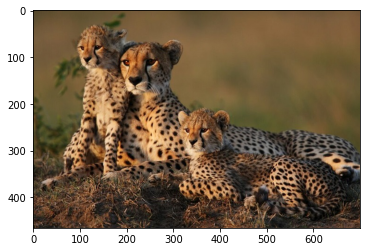

In [13]:
# Reading the image
img = io.imread('https://github.com/alitourani/deep-learning-from-scratch/blob/main/Codes/_data/PersianCheetah.jpg?raw=true')

# Loading and showing the image
plt.imshow(img)
plt.show()

**2. Augmentation using tf.random Modules**

2.1. Random Saturation

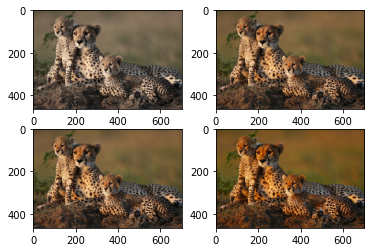

In [ ]:
rangeArray = [(0.1, 1), (0.3, 1), (0.9, 1), (1, 3)]

for idx, range in enumerate(rangeArray):
  augmentedImage = tf.image.random_saturation(img, lower=range[0], upper=range[1])
  plt.subplot(2, 2, idx+1)
  plt.imshow(augmentedImage.numpy())

2.2. Random Brightness

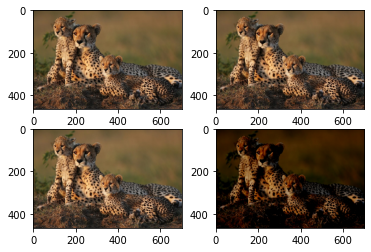

In [ ]:
maxDeltaArray = [0.01, 0.05, 0.1, 1]

for idx, delta in enumerate(maxDeltaArray):
  augmentedImage = tf.image.random_brightness(img, max_delta=delta)
  plt.subplot(2, 2, idx+1)
  plt.imshow(augmentedImage.numpy())

2.3. Random Contrast

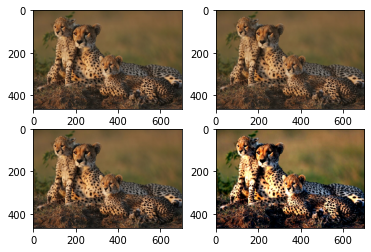

In [ ]:
rangeArray = [(0.1, 1), (0.5, 1), (0.9, 1), (1, 3)]

for idx, range in enumerate(rangeArray):
  augmentedImage = tf.image.random_contrast(img, lower=range[0], upper=range[1])
  plt.subplot(2, 2, idx+1)
  plt.imshow(augmentedImage.numpy())

2.4. Random Flip L/R

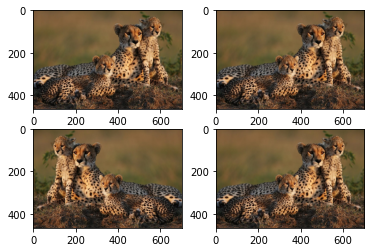

In [ ]:
for idx in [0, 1, 2, 3]:
  augmentedImage = tf.image.random_flip_left_right(img)
  plt.subplot(2, 2, idx+1)
  plt.imshow(augmentedImage.numpy())

2.5. Random Quality

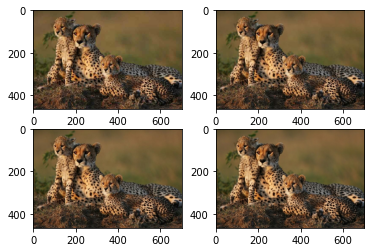

In [ ]:
rangeArray = [(10, 30), (40, 50), (70, 75), (95, 100)]

for idx, range in enumerate(rangeArray):
  augmentedImage = tf.image.random_jpeg_quality(img, min_jpeg_quality=range[0], max_jpeg_quality=range[1])
  plt.subplot(2, 2, idx+1)
  plt.imshow(augmentedImage.numpy())

**3. Augmentation using [imgaug](https://github.com/aleju/imgaug) Library**

📓 Imgaug docs: https://imgaug.readthedocs.io/en/latest/index.html

3.1. Rotation

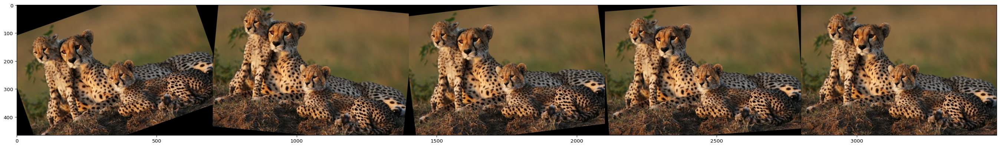

In [21]:
imagesBatch = [img, img, img, img, img]

# Image rotation using random values
rotate = iaa.Affine(rotate=(-20, 20))

# Apply rotation
augImages = rotate(images=imagesBatch)

# Show results
ia.imshow(np.hstack(augImages))

3.2. Cropping

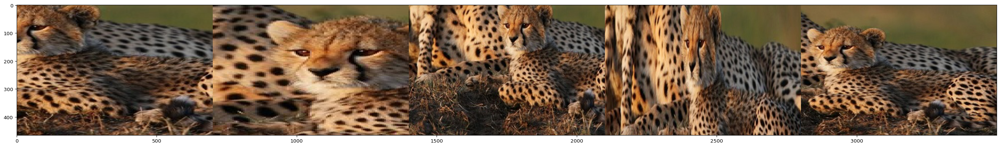

In [22]:
# Cropping using random values
crop = iaa.Crop(percent=(0, 0.5))

# Apply cropping
augImages = crop(images=imagesBatch)

# Show results
ia.imshow(np.hstack(augImages))

3.3. Gaussian Noise

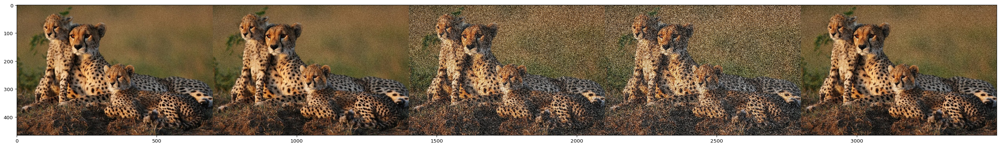

In [24]:
# Adding noise using random values
gaussian = iaa.AdditiveGaussianNoise(scale=(10, 90))

# Apply noise
augImages = gaussian(images=imagesBatch)

# Show results
ia.imshow(np.hstack(augImages))

3.4. Consequtive Filters

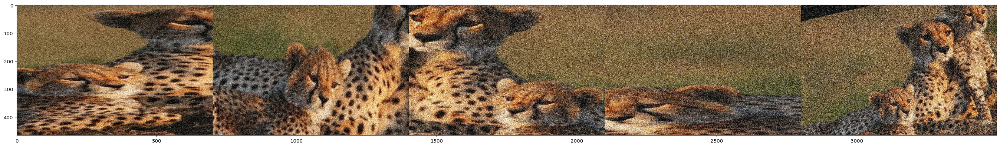

In [26]:
# Adding a sequence of values
sequence = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Affine(rotate=(-20, 20)),
    iaa.AdditiveGaussianNoise(scale=(10, 90)),
    iaa.Crop(percent=(0, 0.5))
], random_order = True)

augImages = sequence(images=imagesBatch)

# Show results
ia.imshow(np.hstack(augImages))